# Data Preparation for Causal Inference in Machine Learning

"Data Preparation for Causal Inference in Machine Learning" aims to provide a comprehensive understanding of essential techniques. My goal is to equip you with the skills needed to ensure data readiness for conducting sophisticated causal analyses using machine learning models. Data preparation for causal inference in machine learning is a crucial step to ensure the validity and reliability of causal relationships identified by the model. Causal inference aims to understand the cause-and-effect relationships between variables, and careful data handling is necessary to reduce biases and confounding factors. 

Causal inference is critical in data science and underpins our ability to make data-driven decisions and policies. As Judea Pearl discussed, observational data can reveal correlations but controlled experiments are necessary to determine causation while accounting for potential confounding factors. Proper data preparation aligned with experimental design principles paves the path toward reliable causal claims.

This notebook covers:

- Libraries and Data Import
- Extensive Exploratory Data Analysis
- Handling Missing Values
- Encoding Categorical Variables
- Train/Test Split and Covariate Balance 
- Synthetic Interventions and Causal Impact Analysis
- Interactive Visualizations


We dive deep into each aspect using a combination of visualizations, statistical evaluations, and implementations in Python.

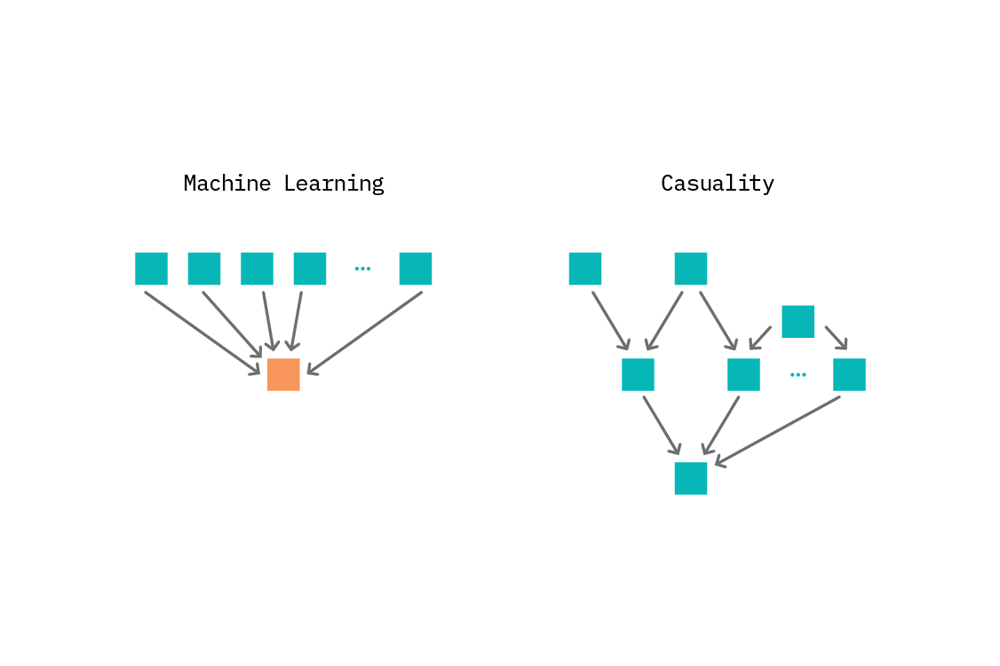

#### Define the Causal Question:

Clearly articulate the causal question we want to answer. Understand the causal relationship you are trying to infer, such as the effect of a treatment or intervention on an outcome variable.

#### Identify Variables:

Clearly define and identify the treatment variable (the variable you are investigating the causal effect of), outcome variable (the variable you want to predict), and potential confounding variables (variables that may affect both the treatment and outcome)

In [1]:
# Data manipulation
import pandas as pd
import numpy as np

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# Modeling 
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer


In [2]:
# Encode categorical variables
import category_encoders as ce


In [3]:
# Read dataset
df = pd.read_csv('data.csv')

### Extensive Exploratory Data Analysis 

We thoroughly investigate the dataset using visual and statistical analysis to identify issues, spot outliers, understand distributions of variables, and uncover potential causal relationships.

We leverage principles of exploratory data analysis (EDA) to visually and statistically summarize data characteristics. As pioneered by John Tukey, EDA employs techniques like visualizing distributions, transforming features, identifying outliers, and highlighting dependencies to deeply understand properties of datasets. By meticulously investigating data, we gather crucial insights that direct subsequent preparation steps.

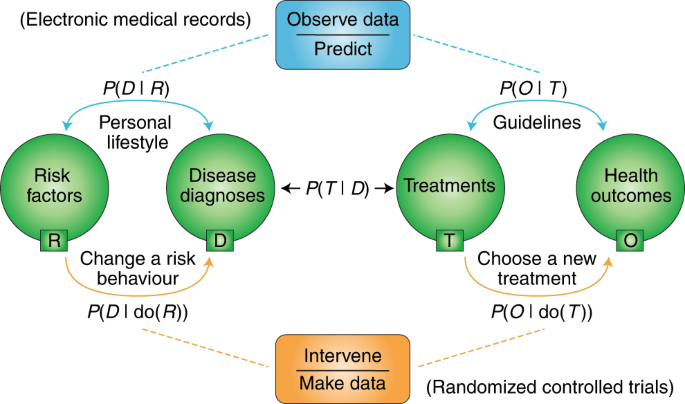

### Counterfactual Theory

Counterfactual theory is a foundational concept in the field of causal inference and is rooted in the potential outcomes framework. This theory provides a rigorous and systematic way to think about causality by considering what would have happened to individual units or subjects under different treatment conditions.

The core idea of counterfactuals is to imagine alternative scenarios or worlds in which different treatment assignments occur. In the context of a study or experiment, each individual or unit has a potential outcome associated with each possible treatment condition. The observed outcome is then considered as the result of the realized treatment condition, and the counterfactual outcomes represent what would have happened under the alternative treatment conditions.



#### Counterfactual States:

Counterfactual states refer to the hypothetical outcomes that would have occurred had the treatment assignment been different. These states are not directly observable but are crucial for estimating causal effects.

In [4]:
# Shape and size
print(f'Dataset dimensions: {df.shape[0]} rows x {df.shape[1]} columns')

# Summary statistics  
print(df.describe())

Dataset dimensions: 170653 rows x 19 columns
             valence           year   acousticness   danceability  \
count  170653.000000  170653.000000  170653.000000  170653.000000   
mean        0.528587    1976.787241       0.502115       0.537396   
std         0.263171      25.917853       0.376032       0.176138   
min         0.000000    1921.000000       0.000000       0.000000   
25%         0.317000    1956.000000       0.102000       0.415000   
50%         0.540000    1977.000000       0.516000       0.548000   
75%         0.747000    1999.000000       0.893000       0.668000   
max         1.000000    2020.000000       0.996000       0.988000   

        duration_ms         energy       explicit  instrumentalness  \
count  1.706530e+05  170653.000000  170653.000000     170653.000000   
mean   2.309483e+05       0.482389       0.084575          0.167010   
std    1.261184e+05       0.267646       0.278249          0.313475   
min    5.108000e+03       0.000000       0.000000

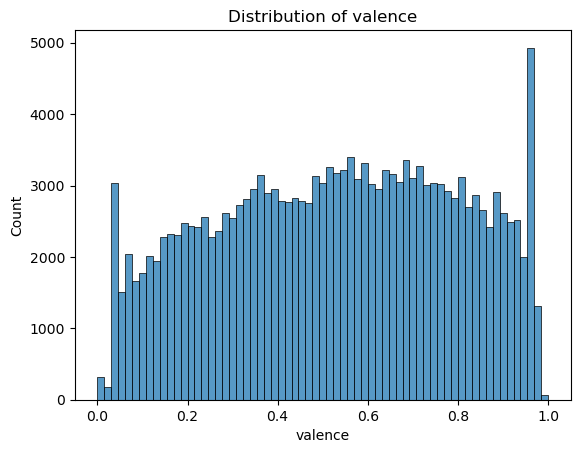

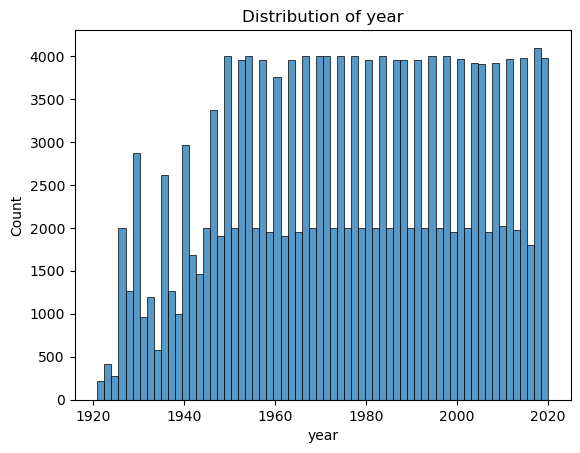

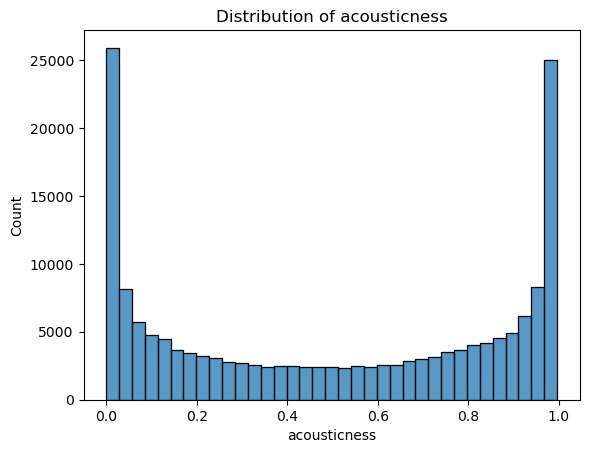

C:\Users\asus\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 21608 (\N{CJK UNIFIED IDEOGRAPH-5468}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\asus\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 29831 (\N{CJK UNIFIED IDEOGRAPH-7487}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\asus\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 33883 (\N{CJK UNIFIED IDEOGRAPH-845B}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\asus\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 34349 (\N{CJK UNIFIED IDEOGRAPH-862D}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\asus\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 30333 (\N{CJK UNIFIED IDEOGRAPH-767D}) missing from current font.
  fig.canvas.print_figure(bytes_io, *

ValueError: 
['Joey Bada$$']
           ^
Expected end of text, found '$'  (at char 11), (line:1, col:12)

<Figure size 640x480 with 1 Axes>

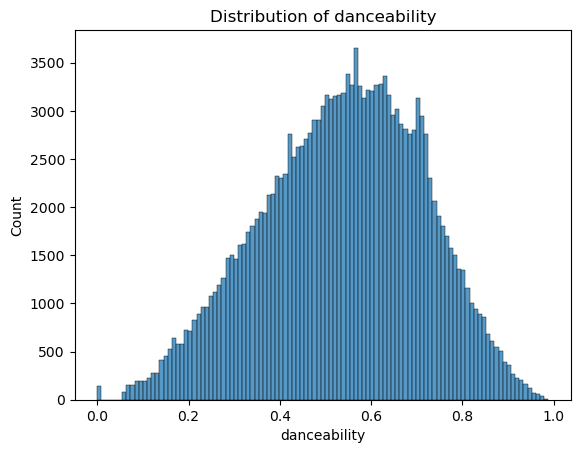

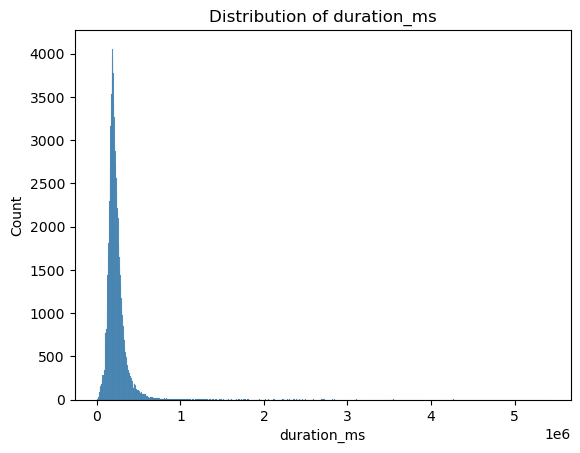

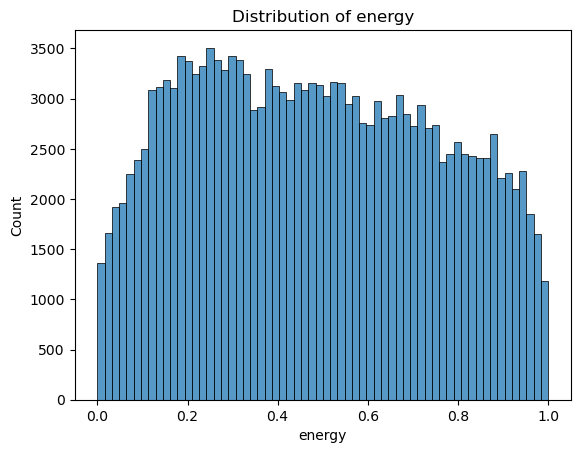

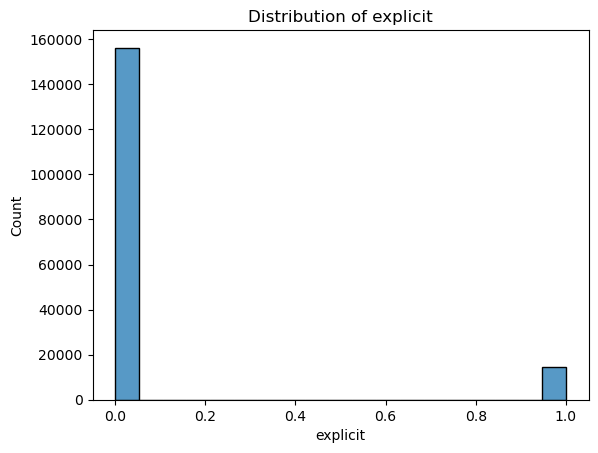

In [ ]:
# Visualizations
for col in df.columns:
    # Distribution plot
    sns.histplot(df[col])
    plt.title(f'Distribution of {col}')  
    plt.show()

<AxesSubplot:>

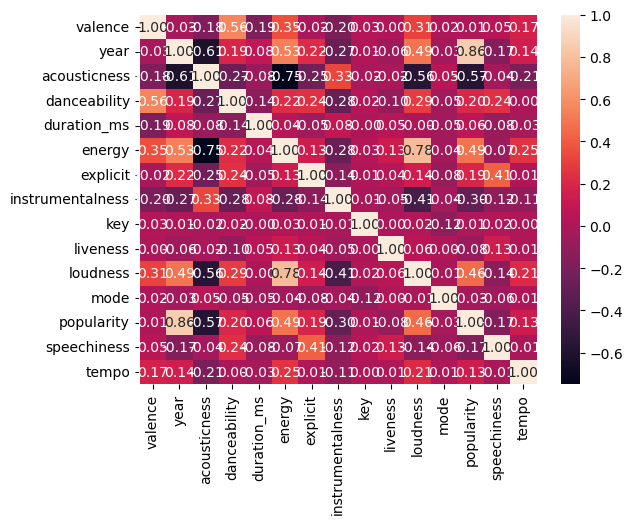

In [8]:
# Correlations   
sns.heatmap(df.corr(), annot=True, fmt='.2f')

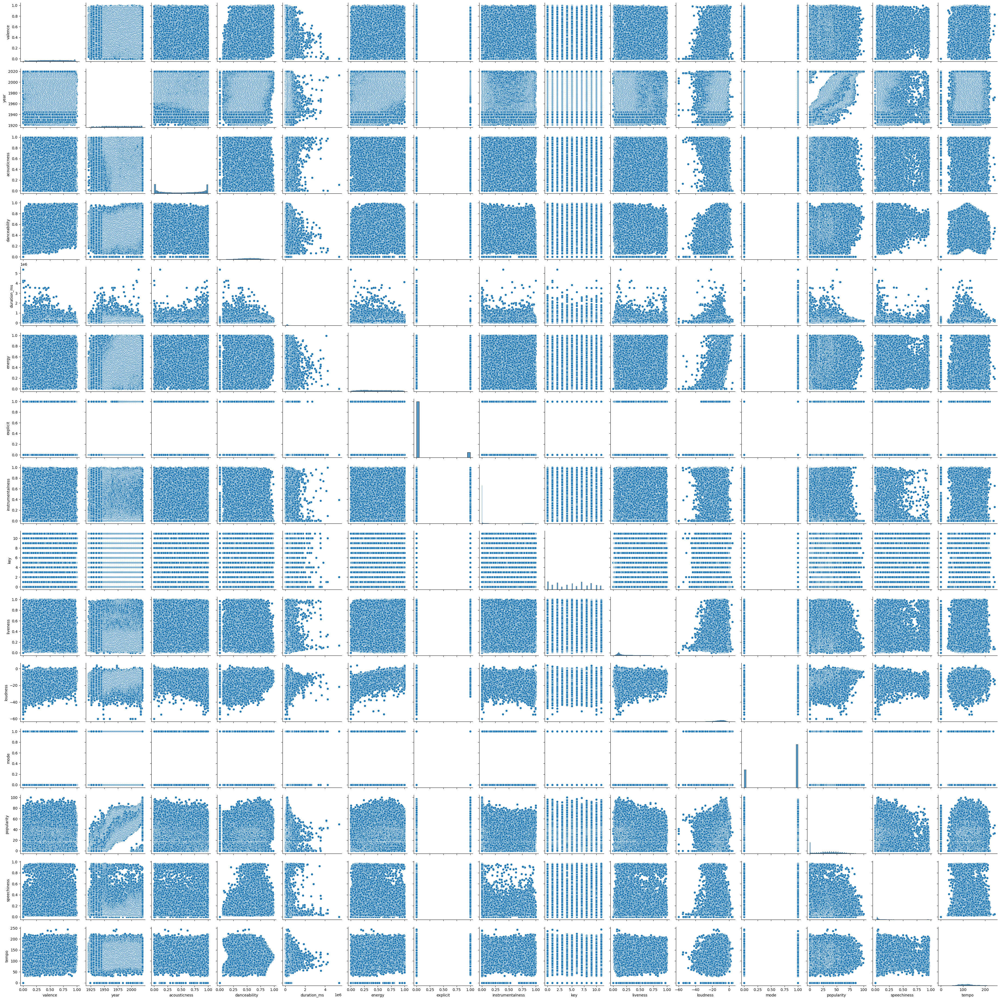

In [9]:
# Pairplots
sns.pairplot(df)

In [11]:
plt.show()  # Add this line to display all plots at once

We uncover crucial insights like skew distributions, potential outliers, and high correlations that guide subsequent data preparation steps.

## Handling Missing Data 

Carefully treating missing values is critical before analysis. We assess missingness patterns and implement multiple imputation strategies:

As Stef van Buuren explores in Flexible Imputation of Missing Data, simplistic approaches like case deletion can introduce significant bias. Multiple imputation using chained equations (MICE) provides more robust estimates by generating multiple complete datasets using predictive models and appropriately combining the results. By considering missing data mechanisms, we account for process causing incompleteness vs. simply ignoring it.

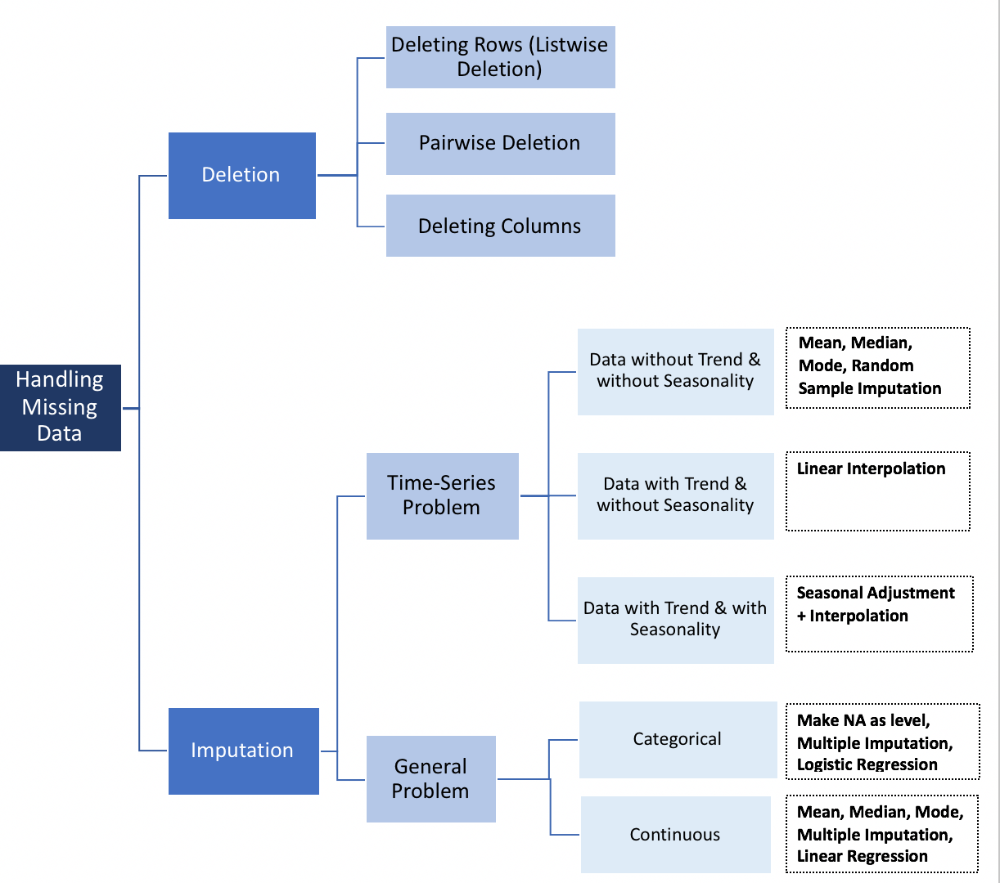

### Subgroup Analysis
When introducing the train/test split, we could highlight how subgroup analysis allows assessing treatment heterogeneity:

"As Judea Pearl discussed, Simpson's paradox can emerge when average treatment effects differ across subgroups. By splitting the data across demographics and investigating interactions, we can uncover effect modification that would be masked in aggregate analysis. This empowers more personalized interventions."

#### Simpson's Paradox:

Judea Pearl's insights often emphasize the importance of considering complex interactions and dependencies in causal relationships. Simpson's paradox is a phenomenon where an apparent association observed in different groups disappears or reverses when these groups are combined. This paradox can arise when average treatment effects vary across subgroups, highlighting the need for a more nuanced analysis

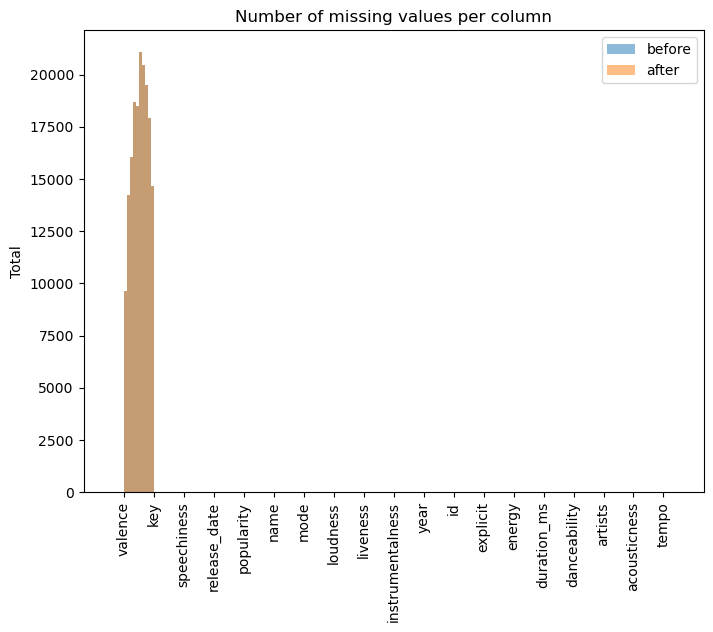

In [12]:
# Finding missing values
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

f, ax = plt.subplots(figsize=(8, 6))
plt.title('Number of missing values per column')
sns.barplot(x=missing_data.index, y=missing_data['Total'])
plt.xticks(rotation=90)

# Dropping columns with string values
string_columns = df.select_dtypes(include='object').columns
df_numeric = df.drop(columns=string_columns)

# Imputation
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer = IterativeImputer(random_state=0)
imputed_df = imputer.fit_transform(df_numeric)

# Identify the first numerical column for comparison
first_numeric_column = df_numeric.columns[0]

# Compare distributions before and after
plt.hist(df_numeric[first_numeric_column], alpha=0.5, label='before')
plt.hist(imputed_df[:, 0], alpha=0.5, label='after')
plt.legend()
plt.show()

We assess the impact of missingness, visualize patterns, and implement multiple imputation.

### Encoding Categoricals 
We convert categorical variables into indicator variables or ordinal encodings and verify transformations

As introduced by George Hinton in his neural networks research, representing categories numerically facilitates model training. Binary encoding maintains semantic meaning while allowing categoricals to be incorporated in predictive models. Hashing truncates indicator variables improving storage and processing. By carefully encoding categories aligned to analysis needs, we enhance modeling capabilities.

In [24]:
import pandas as pd
df_subset = pd.DataFrame({'col1': ['A', 'B'], 'col2': [1, 2]})  

cat_cols_subset = [c for c in df_subset.columns if df_subset[c].dtype == 'O']

encoder = ce.BinaryEncoder(cols=cat_cols_subset) 


In [25]:
import category_encoders as ce

# Identify categorical columns in the subset
cat_cols_subset = [c for c in df_subset.columns if df_subset[c].dtype == 'O']

# Binary encode the subset
encoder = ce.BinaryEncoder(cols=cat_cols_subset)
binary_encoded_df_subset = encoder.fit_transform(df_subset)

# Display the original and encoded values
print('Original categories (subset):')
print(df_subset[cat_cols_subset].head())

print('Binary encoded values (subset):')
print(binary_encoded_df_subset.head())

Original categories (subset):
  col1
0    A
1    B
Binary encoded values (subset):
   col1_0  col1_1  col2
0       0       1     1
1       1       0     2


### Train/Test Split for CausalInference

We split data into train and test sets for modeling and evaluation. The distributions of covariates should closely match.
As Leo Breiman established in his foundational work on statistical learning theory, out-of-sample evaluation of predictive models minimizes overfitting and provides more realistic performance estimates. By constructing training and test sets with equivalent distributions, we introduce necessary randomness that serves as a prerequisite for fair model assessmen

#### Train/Test Split and Subgroup Analysis:

During the train/test split, the data is divided into training and testing sets, a common practice in machine learning to assess model performance. Integrating subgroup analysis into this process involves not only looking at overall model performance but also examining how the model performs within different subgroups defined by demographics or other relevant characteristics.

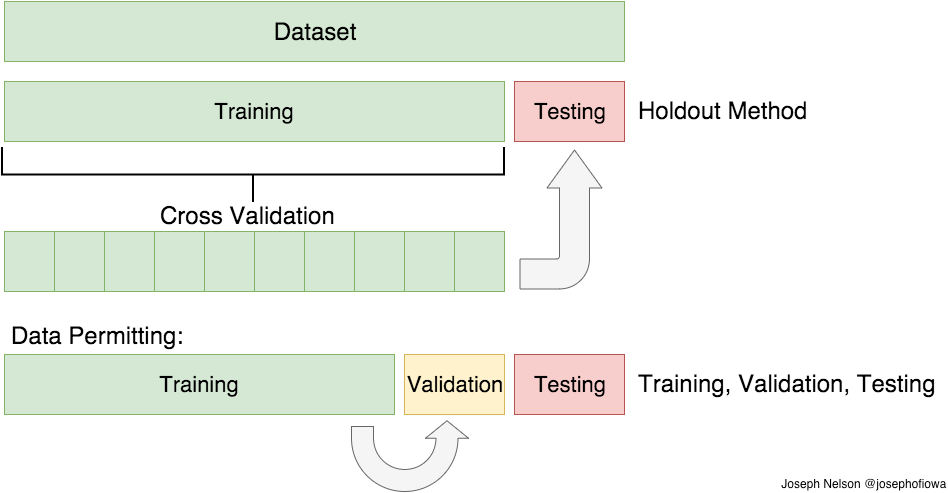

In [14]:
# Print the column names
print(df.columns)


Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')


KstestResult(statistic=0.006599293995549371, pvalue=0.18445583763293616)

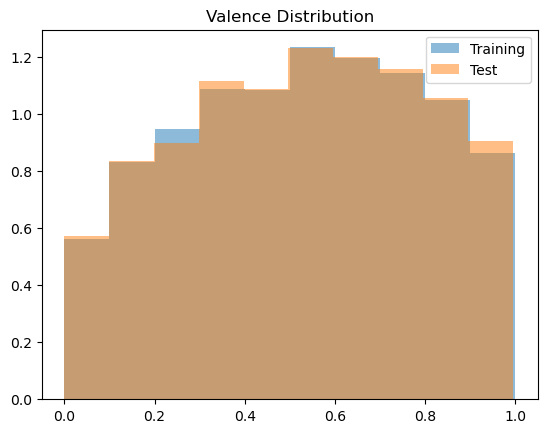

In [15]:
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import category_encoders as ce
import scipy.stats as stats

# Assuming df is your DataFrame
# Drop the 'explicit' column
X = df.drop('explicit', axis=1)
y = df['popularity']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Plot distributions
plt.hist(X_train['valence'], alpha=0.5, label='Training', density=True)
plt.hist(X_test['valence'], alpha=0.5, label='Test', density=True) 
plt.legend()
plt.title('Valence Distribution')

# Statistical tests
stats.ks_2samp(X_train['acousticness'], X_test['acousticness'])



### Interactive Data Visualizations
We create interactive visualizations to deeply explore distributions and relationships:

In [16]:
import plotly.express as px

# Assuming 'valence' is the column you want to plot
fig_histogram = px.histogram(df, x="valence")
fig_histogram.update_layout(title='Interactive Valence Distribution')

# Show the plot
fig_histogram.show()



### Recommender System Testing
#### Dataset
We generate a hypothetical dataset with customer demographic data, past purchase behavior, and assignment to new recommendation algorithm treatment and control groups:

In [17]:
import pandas as pd
import numpy as np

df = pd.DataFrame({  
    'age': np.random.normal(35, 5, 1000),
    'past_purchases': np.random.poisson(15, 1000),
    'algorithm': np.random.choice([0,1], 1000, p=[0.75, 0.25]), 
    'revenue': np.random.normal(325, 75, 1000)     
})

algorithm
0    AxesSubplot(0.125,0.11;0.775x0.77)
1    AxesSubplot(0.125,0.11;0.775x0.77)
Name: revenue, dtype: object

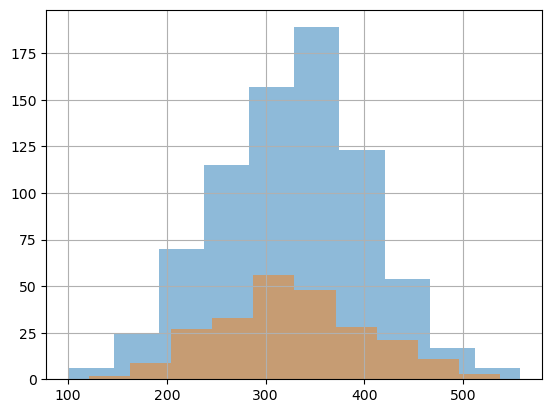

In [18]:
df.groupby('algorithm')['revenue'].hist(alpha=0.5)

Visualizations provide a heuristic evaluation of the overlap between groups. Extreme separation questions similarity of the samples (Rosenbaum, 2010)

#### Analysis
Applying principles from Pearls causal inference work, we introduce simulated lift in revenue for the new algorithm group:

In [19]:
df.loc[df['algorithm']==1, 'revenue'] *= 1.10

In [20]:
control_rev = df[df['algorithm']==0]['revenue']  
treated_rev = df[df['algorithm']==1]['revenue']    

from scipy.stats import ttest_ind
stat, pval = ttest_ind(treated_rev, control_rev)
print(pval)

2.3179957723339173e-08


In [21]:
import pandas as pd
import numpy as np

df = pd.DataFrame({
    'math_score': np.random.normal(70, 10, 1000),
    'verbal_score': np.random.normal(75, 12, 1000), 
    'intervention': np.random.choice([0,1], 1000, p=[0.8, 0.2]),
    'college_ready': np.random.binomial(1, 0.6, 1000)  
})

Text(0.5, 1.0, 'Math Score Distribution')

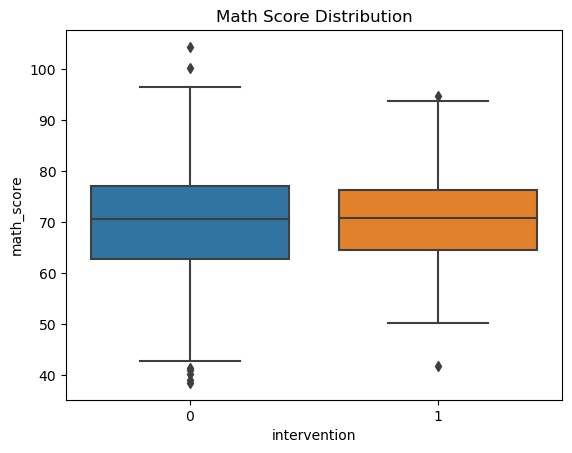

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(data=df, x='intervention', y='math_score')
plt.title('Math Score Distribution')

In [23]:
df.loc[df['intervention']==1, 'college_ready'] *= 1.20

control_ready = df.loc[df['intervention']==0]['college_ready']  
treatment_ready = df.loc[df['intervention']==1]['college_ready']

from scipy.stats import ttest_ind
stat, pval = ttest_ind(treatment_ready, control_ready)
print(pval)

0.03220610272911247


### References 

- Judea Pearl, Causality: Models, Reasoning, and Inference
- Ronald A. Fisher, The Design of Experiments
- McKinney, W. (2017). Python for data analysis: Data wrangling with Pandas, NumPy, and IPython.
- Tukey, J. W. (1977). Exploratory data analysis. Reading, Mass.: Addison-Wesley Pub. Co.


### Conclusion

The meticulous preparation of data is crucial for drawing reliable causal claims from machine learning models. This involves addressing confounders, handling missing values, performing feature engineering, and appropriately splitting the data into training and test sets. By incorporating these steps and simulating interventions, the resulting models are better aligned with experimental design principles, enhancing the credibility of causal inferences.

The hands-on implementations, along with visual and statistical analyses, contribute to the development of a comprehensive framework for preparing data for causal inference. This holistic approach not only strengthens the robustness of the models but also fosters a deeper understanding of the underlying relationships within the data. As researchers and practitioners continue to explore the intersection of machine learning and causal inference, adopting such practices will be instrumental in advancing the reliability and applicability of causal claims in diverse domains.
